<div style="font-variant: small-caps; 
      font-weight: normal; 
      font-size: 37px; 
      text-align: center; 
      padding: 15px; 
      margin: 10px;">
  Machine Learning - Individual Assessment<br>
  </div> 

<div style="font-variant: small-caps; 
      font-weight: normal; 
      font-size: 35px; 
      text-align: center; 
      padding: 15px; 
      margin: 10px;">
  -<br>
  </div> 
  
<div style="font-variant: small-caps; 
      font-weight: normal; 
      font-size: 35px; 
      text-align: center; 
      padding: 15px; 
      margin: 10px;">
      Forest Cover Type<br><br>
  </div> 

<div style="font-variant: small-caps; 
      font-weight: normal; 
      font-size: 25px; 
      text-align: center; 
      padding: 15px; 
      margin: 10px;">
      <font color=orange> Using Random Forest </font>
  </div>

<div style="font-variant: small-caps; 
      font-weight: normal; 
      font-size: 20px; 
      text-align: center; 
      padding: 15px; 
      margin: 10px;">
     Bertrand COQUARD-DSAIS - T1 2022
  </div>

<a id="plan"></a>

## Case Study

-  [About the dataset](#about)<br>
-  [Load the data](#load_data)<br>
-  [Look at the data](#look_data)<br>
-  [Adding Labels to the columns header](#look_columns)<br>
-  [Variable to predict](#output_variable)<br>
-  [SVM Model using Linear SVC](#naive_training)<br>
-  [Logistic regression](#convert_date)<br>
-  [KNN Model for Classification](#convert_strings)<br>
-  [Decision Tree- Random Forrest Classifier](#nans)<br>
-  [Conclusion](#conclusion)<br>




### Imports

In [11]:
# for package auto reload
%load_ext autoreload
%autoreload 2

# for better rendering of plots in jupyter notebook
%matplotlib inline 

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [12]:
# base modules
import os
import sys
import copy 

# Import needed packages
#To manipulate data
import numpy as np
import pandas as pd

#To display graphs
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import tree
import graphviz



#To run Linear SVC
from sklearn.svm import LinearSVC
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split,cross_val_score,GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

#To run Logistic Regression 
from sklearn.linear_model import LogisticRegression

#To run KNN Classifiers
from sklearn.neighbors import KNeighborsClassifier  

# To run Random Forest method and compute confusion matrix and scores
from sklearn.ensemble import RandomForestClassifier



In [13]:
#get the path
os.path.dirname(os.getcwd())

'/Users/bcoquard/Python lesson/Notebooks/advance ML-Course-2022-T1-main'

In [14]:
# path to repo
# path_to_repo = os.path.dirname(os.getcwd())
path_to_repo = os.path.dirname(os.path.dirname(os.path.realpath('__file__')))
path_to_repo

'/Users/bcoquard/Python lesson/Notebooks/advance ML-Course-2022-T1-main'

In [15]:
sys.path.insert(0, os.path.join(path_to_repo, 'src'))

# custom module
from emlyon.utils import *

In [16]:
path_to_Assessment = os.path.join(path_to_repo, "data", "Assessment", "") #I have a path to a new folder 
path_to_Assessment

'/Users/bcoquard/Python lesson/Notebooks/advance ML-Course-2022-T1-main/data/Assessment/'

# Data preprocessing

[Back to top](#plan)

<a id="about"></a>

### $\bullet$ About the dataset 

[Back to top](#plan)

We wil be looking at a  dataset contains a bit more than half a million observations with 54 features. Each observation represents a 30x30 meter tract of land in wilderness areas in Colorado obtained from US Forest Service (USFS)- (Region 2 Resource Information System (RIS) data). The features record cartographic data about each tract: 

The objective will be to predict with the higher accuracy,  the type of tree based on  54 variables : elevation, aspect, distance to water/roads/past wildfire ignition points, amount of shade at various times of day, and which of 40 soil types it contains. 



Here is the link to the page that provides more informations about the dataset
http://kdd.ics.uci.edu/databases/covertype/covertype.data.html

There are not split of the data at that stage. Those are raw datas


<a id="load_data"></a>

### $\bullet$ Import the data

[Back to top](#plan)

In [17]:
# chose one of the equivalent 
path_to_datasets = os.path.join(path_to_Assessment, 'covtype.data')
print(path_to_datasets)

path_to_datasets = '{}covtype.data'.format(path_to_Assessment)
print(path_to_datasets)

/Users/bcoquard/Python lesson/Notebooks/advance ML-Course-2022-T1-main/data/Assessment/covtype.data
/Users/bcoquard/Python lesson/Notebooks/advance ML-Course-2022-T1-main/data/Assessment/covtype.data


In [18]:
#Load the Dataset as df_raw
df_raw = pd.read_table(path_to_datasets, sep=',', header=None)

<a id="look_data"></a>

### $\bullet$ Look at the data

[Back to top](#plan)

The objective is to have a first look at the data set and get facts and assumptions.

In [19]:
# print the 5 first and last rows
df_raw

,0,1,2,3,4,5,6,7,8,9,...,45,46,47,48,49,50,51,52,53,54
0,2596,51,3,258,0,510,221,232,148,6279,...,0,0,0,0,0,0,0,0,0,5
1,2590,56,2,212,-6,390,220,235,151,6225,...,0,0,0,0,0,0,0,0,0,5
2,2804,139,9,268,65,3180,234,238,135,6121,...,0,0,0,0,0,0,0,0,0,2
3,2785,155,18,242,118,3090,238,238,122,6211,...,0,0,0,0,0,0,0,0,0,2
4,2595,45,2,153,-1,391,220,234,150,6172,...,0,0,0,0,0,0,0,0,0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
581007,2396,153,20,85,17,108,240,237,118,837,...,0,0,0,0,0,0,0,0,0,3
581008,2391,152,19,67,12,95,240,237,119,845,...,0,0,0,0,0,0,0,0,0,3
581009,2386,159,17,60,7,90,236,241,130,854,...,0,0,0,0,0,0,0,0,0,3
581010,2384,170,15,60,5,90,230,245,143,864,...,0,0,0,0,0,0,0,0,0,3


Looking at the dataset for the first time :
- The data set is composed of 581012 rows and 55 columns.
- Some assumptions : it seems that the values are all in numerical format with a lot of 0 in the last columns except for the last column.
Let's try to get more informations by looking at the data info given by the author of the file




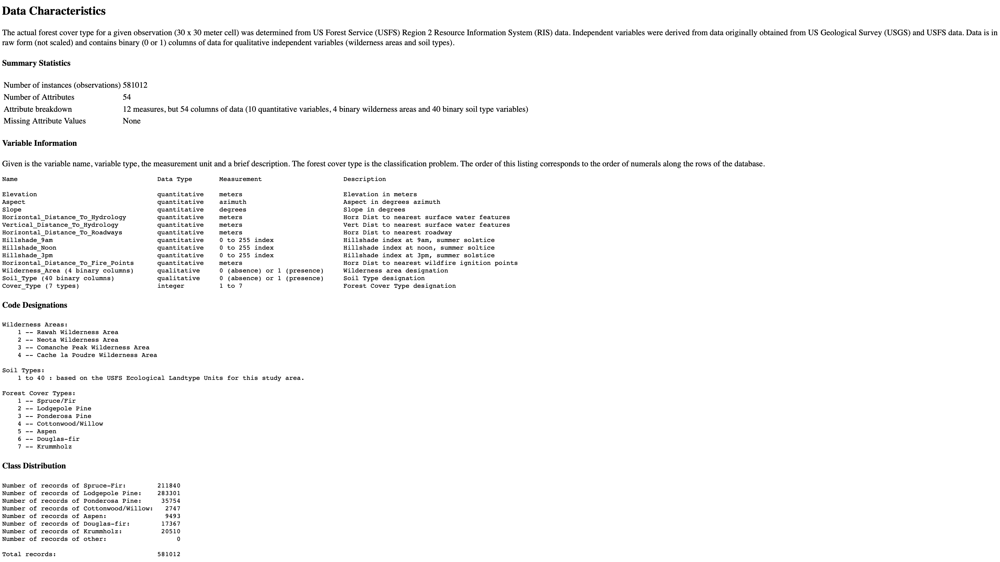


In [20]:
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 581012 entries, 0 to 581011
Data columns (total 55 columns):
 #   Column  Non-Null Count   Dtype
---  ------  --------------   -----
 0   0       581012 non-null  int64
 1   1       581012 non-null  int64
 2   2       581012 non-null  int64
 3   3       581012 non-null  int64
 4   4       581012 non-null  int64
 5   5       581012 non-null  int64
 6   6       581012 non-null  int64
 7   7       581012 non-null  int64
 8   8       581012 non-null  int64
 9   9       581012 non-null  int64
 10  10      581012 non-null  int64
 11  11      581012 non-null  int64
 12  12      581012 non-null  int64
 13  13      581012 non-null  int64
 14  14      581012 non-null  int64
 15  15      581012 non-null  int64
 16  16      581012 non-null  int64
 17  17      581012 non-null  int64
 18  18      581012 non-null  int64
 19  19      581012 non-null  int64
 20  20      581012 non-null  int64
 21  21      581012 non-null  int64
 22  22      581012 non-n

In [21]:
#Now that we know what the data should be , let's try to find to which variable the columns belong to 
df_raw.describe(include='all')

,0,1,2,3,4,5,6,7,8,9,...,45,46,47,48,49,50,51,52,53,54
count,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,...,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000
mean,2959.365301,155.656807,14.103704,269.428217,46.418855,2350.146611,212.146049,223.318716,142.528263,1980.291226,...,0.090392,0.077716,0.002773,0.003255,0.000205,0.000513,0.026803,0.023762,0.015060,2.051471
std,279.984734,111.913721,7.488242,212.549356,58.295232,1559.254870,26.769889,19.768697,38.274529,1324.195210,...,0.286743,0.267725,0.052584,0.056957,0.014310,0.022641,0.161508,0.152307,0.121791,1.396504
min,1859.000000,0.000000,0.000000,0.000000,-173.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,2809.000000,58.000000,9.000000,108.000000,7.000000,1106.000000,198.000000,213.000000,119.000000,1024.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,2996.000000,127.000000,13.000000,218.000000,30.000000,1997.000000,218.000000,226.000000,143.000000,1710.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,3163.000000,260.000000,18.000000,384.000000,69.000000,3328.000000,231.000000,237.000000,168.000000,2550.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
max,3858.000000,360.000000,66.000000,1397.000000,601.000000,7117.000000,254.000000,254.000000,254.000000,7173.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,7.000000


We can draw more assumptions now that we have access to the data characteristics document above :
- There seems to be no missing and NaN values as the count is 581012 for all columns displayed.
- The first 10 columns have large variance between the columns and within the column; Min at 0 and max up to 7173.

Let's assume those 10 columns from Index 0 to 9 represent the folowing variables :
Index 0 Elevation, in meters 	Elevation in meters-> Min Value 1859m, Max 3858m- 
Index 1 Aspect	, azimuth		Aspect in degrees azimuth-> Min Value O max 360 degree- 
Index 2 Slope	,degrees		Slope in degrees-> Min Value 0 max slope 66 degree-
Index 3 Horizontal_Distance_To_Hydrology, meters			Horz Dist to nearest surface water features
Index 4 Vertical_Distance_To_Hydrology, ,meters				Vert Dist to nearest surface water features; min -173m
Index 5 Horizontal_Distance_To_Roadways	,meters				Horz Dist to nearest roadway
Index 6 Hillshade_9am            	0 to 255 index			Hillshade index at 9am, summer solstice, 0 to 254
Index 7 Hillshade_Noon			    0 to 255 index			Hillshade index at noon, summer soltice  0 to 254
Index 8 Hillshade_3pm				0 to 255 index			Hillshade index at 3pm, summer solstice 0 to 254
index 9 Horizontal_Distance_To_Fire_Points	,meters				Horz Dist to nearest wildfire ignition points

- Starting from the 10th column (index 9) up to 55th column excluded ,  min value are 0 and max 1 so we can assume this represent category columns of 0 or 1.

Let's assume those are 
Index 10 to 13  Wilderness_Area (4 binary columns): 0 (absence) or 1 (presence); Wilderness area designation
Wilderness Areas:  	
    Index 10 -- Rawah Wilderness Area
    Index 11 -- Neota Wilderness Area
    Index 12 -- Comanche Peak Wilderness Area
    Index 13 -- Cache la Poudre Wilderness Area

Index 14 to 53  Soil_Type (40 binary columns): 0 (absence) or 1 (presence);Soil Type designation

- The last column ( index 54) has a min of 1 and max of 7 so it might match the column " Cover Type"
Cover_Type (7 types) value 1 to 7				Forest Cover Type designation
Forest Cover Types:	
    1 -- Spruce/Fir
    2 -- Lodgepole Pine
    3 -- Ponderosa Pine
    4 -- Cottonwood/Willow
    5 -- Aspen
    6 -- Douglas-fir
    7 -- Krummholz

Let's verify those assumptions.


In [22]:
#Count the number of Null Values by columns using the bolean method isnull- will return 0 if no Null value is found
df_raw.isnull().sum()

0     0
1     0
2     0
3     0
4     0
5     0
6     0
7     0
8     0
9     0
10    0
11    0
12    0
13    0
14    0
15    0
16    0
17    0
18    0
19    0
20    0
21    0
22    0
23    0
24    0
25    0
26    0
27    0
28    0
29    0
30    0
31    0
32    0
33    0
34    0
35    0
36    0
37    0
38    0
39    0
40    0
41    0
42    0
43    0
44    0
45    0
46    0
47    0
48    0
49    0
50    0
51    0
52    0
53    0
54    0
dtype: int64

> Thanks to the function Describe, we can validate using the min and max that the columns matches the variables indicated on in the data characteristics document for column index 0 to 9 and 45 to 54.
> Observations for columns index 10 to 44 included should have as well 0 or 1 values. 
Let's test it.

In [23]:
#As we will need to see the all dataset couple of time , instead of calling pd.option method, 
#let's define a function called "display_all" using this method to be able to display all the rows and columns and  we want 
#use the method describe. 
#here we set the parameters to display up to 70 columns and 1000 rows
def display_all(df):
    with pd.option_context("display.max_rows", 1000, "display.max_columns", 70): 
        display(df)

In [24]:
#Now let's use describe qgain but now diasplaying all the 55 columns
display_all(df_raw.describe(include = 'all'))

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54
count,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000
mean,2959.365301,155.656807,14.103704,269.428217,46.418855,2350.146611,212.146049,223.318716,142.528263,1980.291226,0.448865,0.051434,0.436074,0.063627,0.005217,0.012952,0.008301,0.021335,0.002749,0.011316,0.000181,0.000308,0.001974,0.056168,0.021359,0.051584,0.030001,0.001031,0.000005,0.004897,0.005890,0.003268,0.006921,0.015936,0.001442,0.057439,0.099399,0.036622,0.000816,0.004456,0.001869,0.001628,0.198356,0.051927,0.044175,0.090392,0.077716,0.002773,0.003255,0.000205,0.000513,0.026803,0.023762,0.015060,2.051471
std,279.984734,111.913721,7.488242,212.549356,58.295232,1559.254870,26.769889,19.768697,38.274529,1324.195210,0.497379,0.220882,0.495897,0.244087,0.072039,0.113066,0.090731,0.144499,0.052356,0.105775,0.013442,0.017550,0.044387,0.230245,0.144579,0.221186,0.170590,0.032092,0.002272,0.069804,0.076518,0.057077,0.082902,0.125228,0.037950,0.232681,0.299197,0.187833,0.028551,0.066605,0.043193,0.040318,0.398762,0.221879,0.205483,0.286743,0.267725,0.052584,0.056957,0.014310,0.022641,0.161508,0.152307,0.121791,1.396504
min,1859.000000,0.000000,0.000000,0.000000,-173.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,2809.000000,58.000000,9.000000,108.000000,7.000000,1106.000000,198.000000,213.000000,119.000000,1024.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,2996.000000,127.000000,13.000000,218.000000,30.000000,1997.000000,218.000000,226.000000,143.000000,1710.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,3163.000000,260.000000,18.000000,384.000000,69.000000,3328.000000,231.000000,237.000000,168.000000,2550.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000

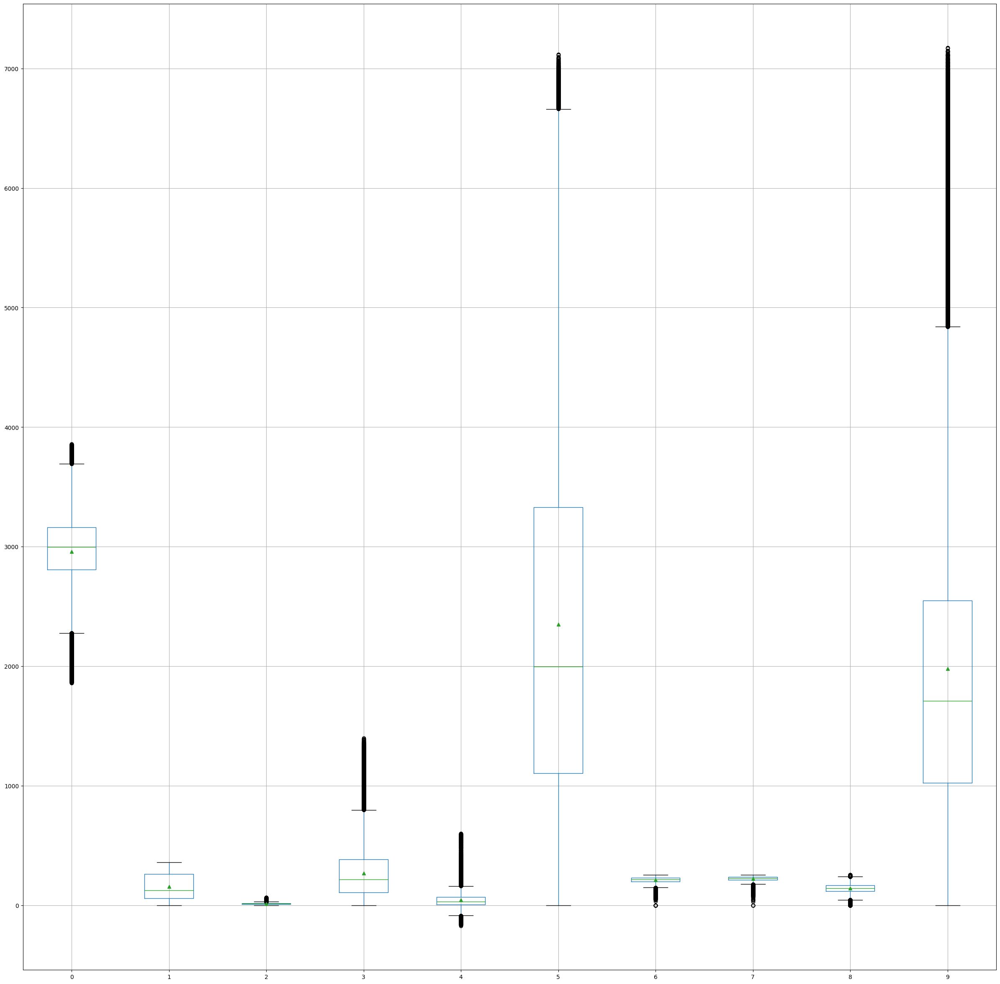

In [25]:
#Let's Visualize the full results drawing a boxplot, first for the 10 first columns with min, max & mean
boxplot=df_raw.loc[:,0:9].boxplot(showmeans=True,figsize=(30,30))

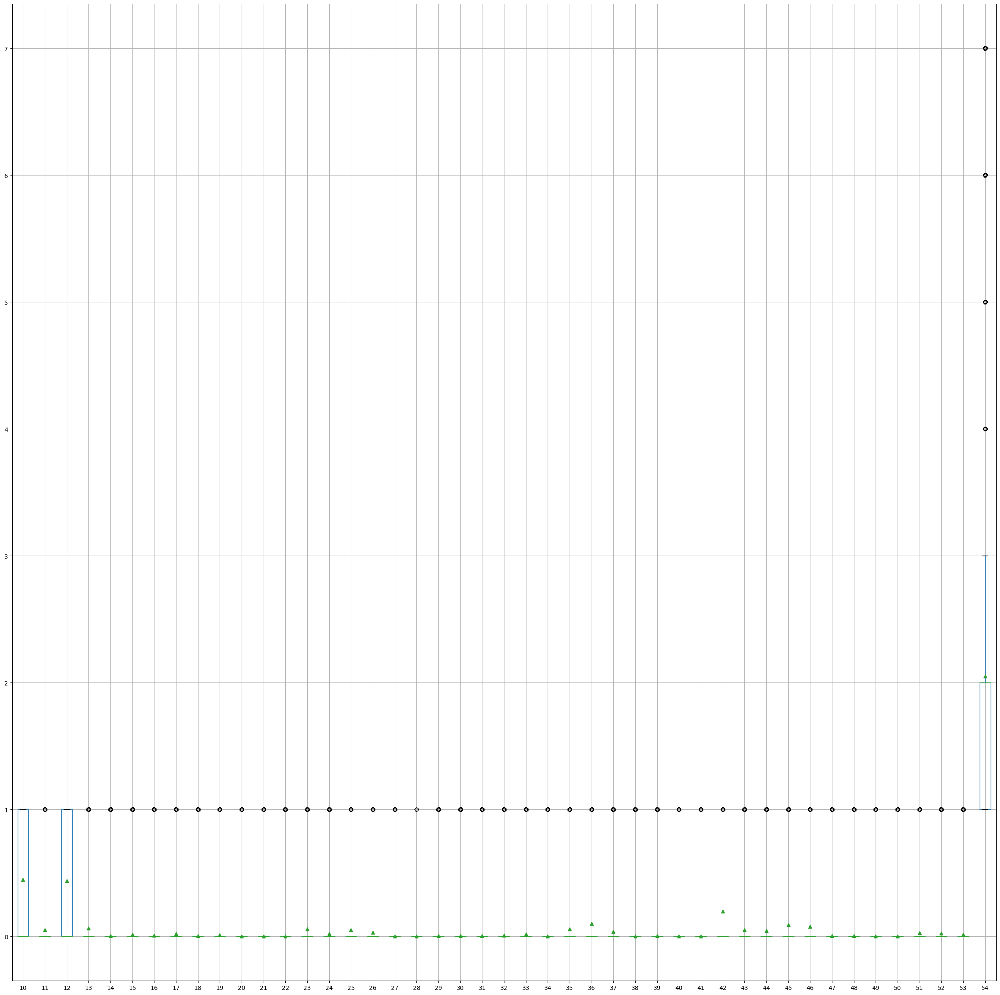

In [26]:
#We can see that some features have a large variance (index 5 and 9 which represents the horizontal distance 
#to high roads and fire points.
#Let's Visualize the full results drawing a boxplot, first for the 35 last columns
# to check that those columns seems to be categorical columns with 0 or 1 and for the last one between 1 & 7.
boxplot=df_raw.loc[:,10:].boxplot(showmeans=True,figsize=(30,30))

<a id="look_columns"></a>

 > Clearly we can see that the last 35 features have values between 0 and 1, compatible wih a type of 0 and 1 category class. 
 > Now that we have verified all our assumptions, let's include headers on the columns so that we have a more 
readeable dataset.

### $\bullet$ Adding Labels to the columns header.

[Back to top](#plan)

In [27]:
#before touching the dataset I make a copy of the original dataset
df_labelled = copy.deepcopy(df_raw)

In [28]:
df_raw.columns

Int64Index([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
            17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
            34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
            51, 52, 53, 54],
           dtype='int64')

In [29]:
#Adding the labels features
df_raw.rename(columns = {0: 'Elevation',
                   1: 'Aspect',
                   2: 'Slope',
                   3: 'Horizontal_Distance_To_Hydrology',
                   4: 'Vertical_Distance_To_Hydrology',
                   5: 'Horizontal_Distance_To_Roadways',
                   6: 'Hillshade_9am',
                   7: 'Hillshade_Noon',
                   8: 'Hillshade_3pm',
                   9: 'Horizontal_Distance_To_Fire_Points',
                   10: 'Rawah Wilderness Area',
                   11: 'Neota Wilderness Area',
                   12: 'Comanche Peak Wilderness Area',
                   13: 'Cache la Poudre Wilderness Area',
                   14: 'Wilderness Area 1',
                   15: 'Wilderness Area 2',
                    16: 'Wilderness Area 3',
                    17: 'Wilderness Area 4',
                    18:'Soil Type 1',
                         19:'Soil Type 2',
                         20:'Soil Type 3',
                         21:'Soil Type 4',
                         22:'Soil Type 5',
                         23:'Soil Type 6',
                         24:'Soil Type 7',
                         25:'Soil Type 8',
                         26:'Soil Type 9',
                         27:'Soil Type 10',
                         28:'Soil Type 11',
                         29:'Soil Type 12',
                         30:'Soil Type 13',
                         31:'Soil Type 14',
                         32:'Soil Type 15',
                         33:'Soil Type 16',
                         34:'Soil Type 17',
                         35:'Soil Type 18',
                         36:'Soil Type 19',
                         37:'Soil Type 20',
                         38:'Soil Type 21',
                         39:'Soil Type 22',
                         40:'Soil Type 23',
                         41:'Soil Type 24',
                         42:'Soil Type 25',
                         43:'Soil Type 26',
                         44:'Soil Type 27',
                         45:'Soil Type 28',
                         46:'Soil Type 29',
                         47:'Soil Type 30',
                         48:'Soil Type 31',
                         49:'Soil Type 32',
                         50:'Soil Type 33',
                         51:'Soil Type 34',
                         52:'Soil Type 35',
                         53:'Soil Type 36',
                    54: 'Cover_Type'}, inplace = True)

In [30]:
df_raw.columns

Index(['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
       'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
       'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
       'Horizontal_Distance_To_Fire_Points', 'Rawah Wilderness Area',
       'Neota Wilderness Area', 'Comanche Peak Wilderness Area',
       'Cache la Poudre Wilderness Area', 'Wilderness Area 1',
       'Wilderness Area 2', 'Wilderness Area 3', 'Wilderness Area 4',
       'Soil Type 1', 'Soil Type 2', 'Soil Type 3', 'Soil Type 4',
       'Soil Type 5', 'Soil Type 6', 'Soil Type 7', 'Soil Type 8',
       'Soil Type 9', 'Soil Type 10', 'Soil Type 11', 'Soil Type 12',
       'Soil Type 13', 'Soil Type 14', 'Soil Type 15', 'Soil Type 16',
       'Soil Type 17', 'Soil Type 18', 'Soil Type 19', 'Soil Type 20',
       'Soil Type 21', 'Soil Type 22', 'Soil Type 23', 'Soil Type 24',
       'Soil Type 25', 'Soil Type 26', 'Soil Type 27', 'Soil Type 28',
       'Soil Type 29', 'Soil Type 

In [31]:
#Let's check if all values are numerical in order to be able to apply a Random Forest Model
df_raw.dtypes 

Elevation                             int64
Aspect                                int64
Slope                                 int64
Horizontal_Distance_To_Hydrology      int64
Vertical_Distance_To_Hydrology        int64
Horizontal_Distance_To_Roadways       int64
Hillshade_9am                         int64
Hillshade_Noon                        int64
Hillshade_3pm                         int64
Horizontal_Distance_To_Fire_Points    int64
Rawah Wilderness Area                 int64
Neota Wilderness Area                 int64
Comanche Peak Wilderness Area         int64
Cache la Poudre Wilderness Area       int64
Wilderness Area 1                     int64
Wilderness Area 2                     int64
Wilderness Area 3                     int64
Wilderness Area 4                     int64
Soil Type 1                           int64
Soil Type 2                           int64
Soil Type 3                           int64
Soil Type 4                           int64
Soil Type 5                     

In [32]:
#Checking that we have not lost any data doing the various above transformations of the dataset.
#Calculating the number of columns
len(df_raw.columns)

55

In [33]:
#calculating size of the dataset ( number of rows/points, number of columns/features)
df_raw.shape 

(581012, 55)

### $\bullet$ Finalizing the Data Processing and determining the variable to predict

[Back to top](#plan)

In [34]:
# Saving a copy of df_raw
df_labelled_f = copy.deepcopy(df_raw)
df=df_raw
#splitting the data into X and Y

y = df['Cover_Type']
X = df.drop('Cover_Type', axis=1)

In [35]:
#Let's check X and y values

In [36]:
y

0         5
1         5
2         2
3         2
4         5
         ..
581007    3
581008    3
581009    3
581010    3
581011    3
Name: Cover_Type, Length: 581012, dtype: int64

In [37]:
X.T

,0,1,2,3,4,5,6,7,8,9,...,581002,581003,581004,581005,581006,581007,581008,581009,581010,581011
Elevation,2596,2590,2804,2785,2595,2579,2606,2605,2617,2612,...,2419,2415,2410,2405,2401,2396,2391,2386,2384,2383
Aspect,51,56,139,155,45,132,45,49,45,59,...,168,161,158,159,157,153,152,159,170,165
Slope,3,2,9,18,2,6,7,4,9,10,...,25,25,24,22,21,20,19,17,15,13
Horizontal_Distance_To_Hydrology,258,212,268,242,153,300,270,234,240,247,...,108,95,90,90,90,85,67,60,60,60
Vertical_Distance_To_Hydrology,0,-6,65,118,-1,-15,5,7,56,11,...,33,29,24,19,15,17,12,7,5,4
Horizontal_Distance_To_Roadways,510,390,3180,3090,391,67,633,573,666,636,...,124,120,120,120,120,108,95,90,90,67
Hillshade_9am,221,220,234,238,220,230,222,222,223,228,...,230,236,238,237,238,240,240,236,230,231
Hillshade_Noon,232,235,238,238,234,237,225,230,221,219,...,240,237,236,238,238,237,237,241,245,244
Hillshade_3pm,148,151,135,122,150,140,138,144,133,124,...,126,116,115,119,119,118,119,130,143,141
Horizontal_Distance_To_Fire_Points,6279,6225,6121,6211,6172,6031,6256,6228,6244,6230,...,812,815,819,824,830,837,845,854,864,875


In [38]:
#Finally let's see how the classes are balanced.
y.value_counts()


2    283301
1    211840
3     35754
7     20510
6     17367
5      9493
4      2747
Name: Cover_Type, dtype: int64

> The classes are pretty imbalanced — Cover_Type4 is only 1% the size of the biggest Cover_Type2.
Modeling with data with this much class imbalance is a bit risky because models can’t see the big picture. Most porbably ,the model would score highly on accuracy, but it wouldn’t actually help prediuct correctly with  the smaller class. 

> We need to keep that in mlind when we will review and select the best algorithm. 

### $\bullet$ Let's have a look at the corroletion

[Back to top](#plan)

In [39]:
df.columns

Index(['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
       'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
       'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
       'Horizontal_Distance_To_Fire_Points', 'Rawah Wilderness Area',
       'Neota Wilderness Area', 'Comanche Peak Wilderness Area',
       'Cache la Poudre Wilderness Area', 'Wilderness Area 1',
       'Wilderness Area 2', 'Wilderness Area 3', 'Wilderness Area 4',
       'Soil Type 1', 'Soil Type 2', 'Soil Type 3', 'Soil Type 4',
       'Soil Type 5', 'Soil Type 6', 'Soil Type 7', 'Soil Type 8',
       'Soil Type 9', 'Soil Type 10', 'Soil Type 11', 'Soil Type 12',
       'Soil Type 13', 'Soil Type 14', 'Soil Type 15', 'Soil Type 16',
       'Soil Type 17', 'Soil Type 18', 'Soil Type 19', 'Soil Type 20',
       'Soil Type 21', 'Soil Type 22', 'Soil Type 23', 'Soil Type 24',
       'Soil Type 25', 'Soil Type 26', 'Soil Type 27', 'Soil Type 28',
       'Soil Type 29', 'Soil Type 

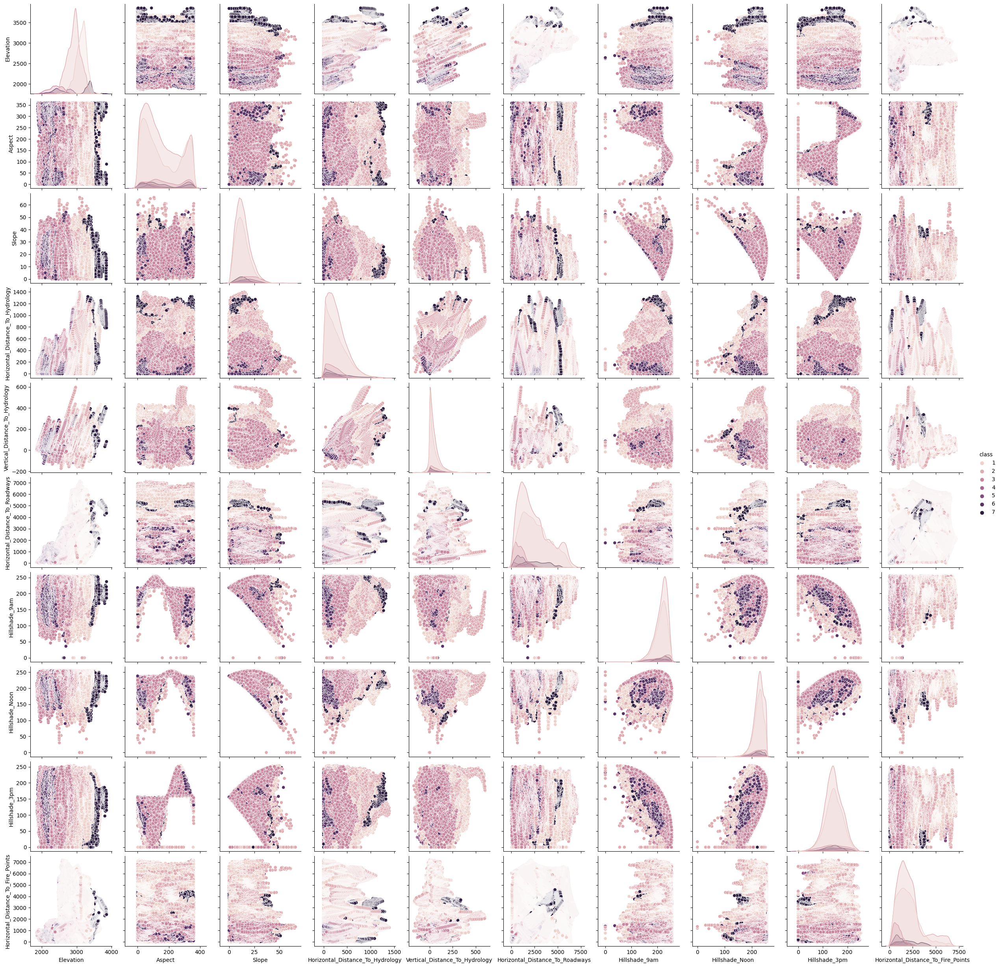

In [42]:
#Let's have a look at pair corelation focusing on the first 11 Features.
df['class'] = y
sns.pairplot(df, hue='class', vars=['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
       'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
       'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
       'Horizontal_Distance_To_Fire_Points'])

<Figure size 640x480 with 0 Axes>

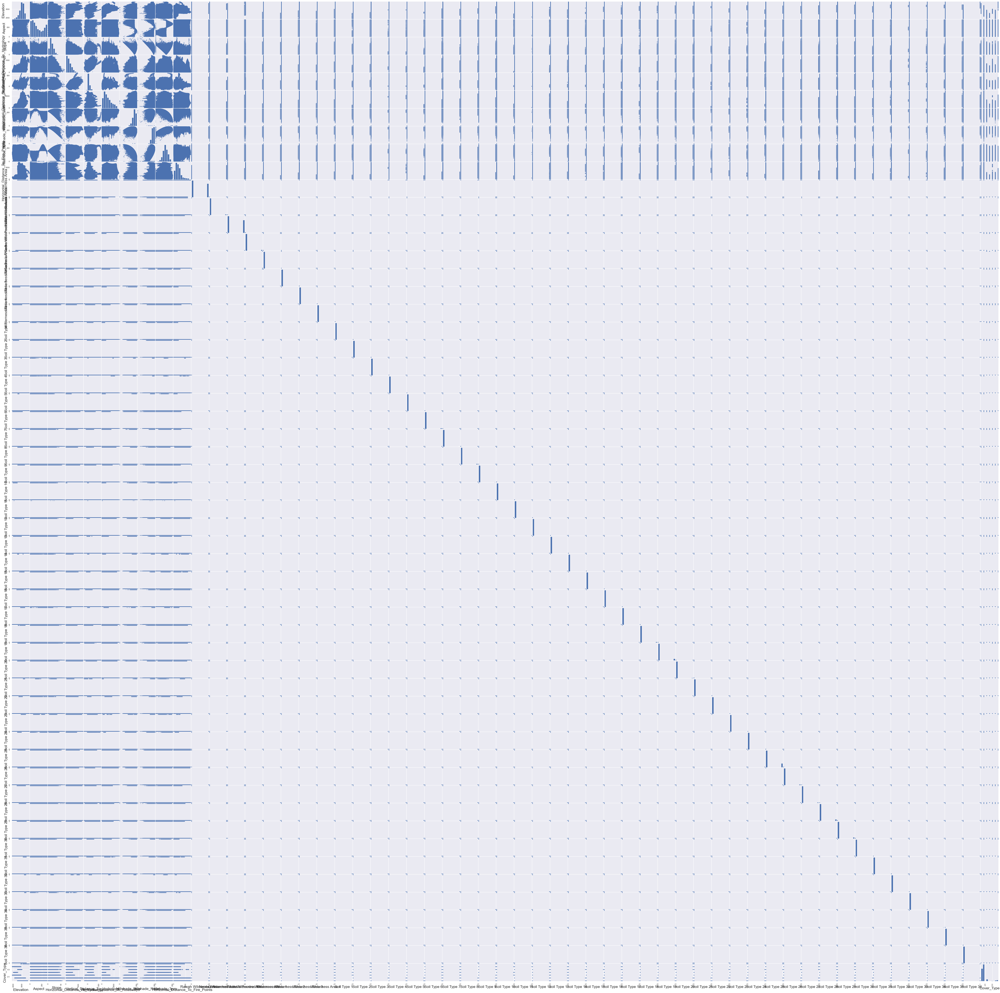

<Figure size 640x480 with 0 Axes>

In [99]:
#Let's plot a scatter matrix for all the feature
pd.plotting.scatter_matrix(df,figsize=(80,80))
plt.figure()

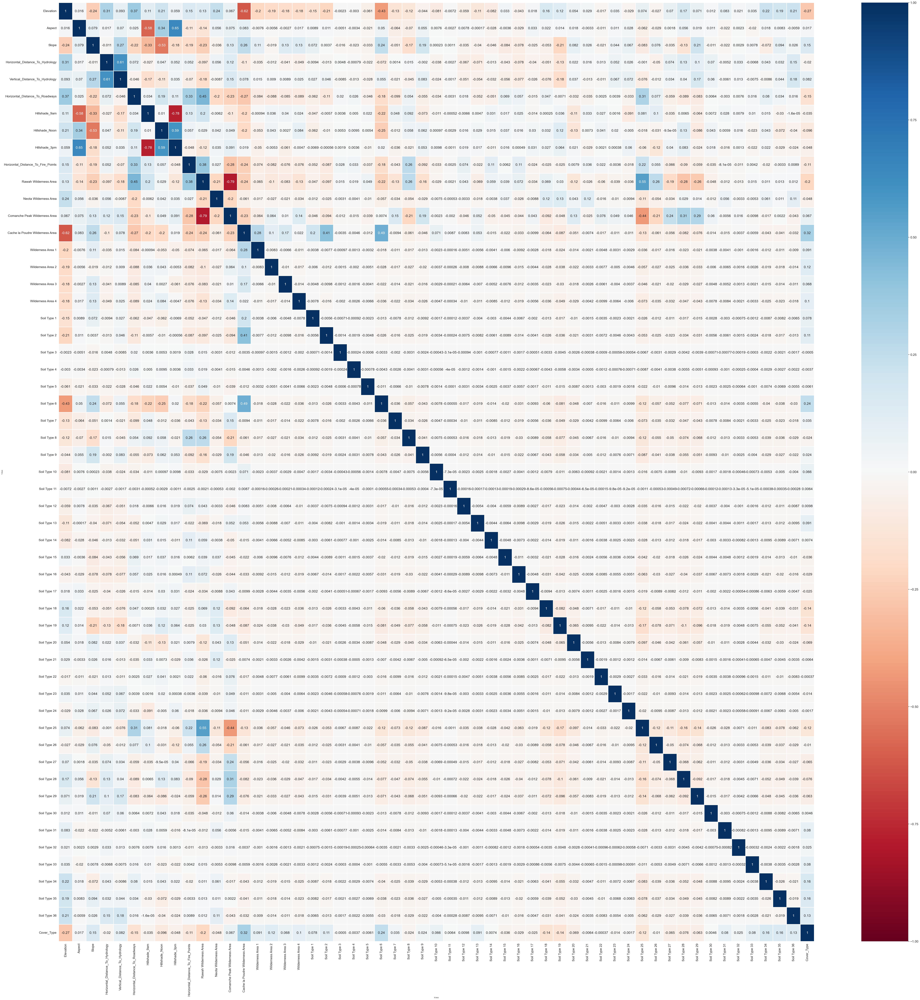

In [98]:
#Let's study the corroletion including all the features using the method .corr and a heatmap
df_corr=df.corr()
plt.figure(figsize=(80,80))
ax = sns.heatmap(df_corr, cmap="RdBu", annot=True,linewidths=2,vmin=-1, vmax=1)
ax.set_xlabel('X-Axis', fontsize=8)
ax.set_ylabel('Y-Axis', fontsize=8)
plt.show()

The good news is that there are very few features for which pair correlation is above 50 or below -50%.
Good example are Cache Lapoudre with Elevation, or comanche Peak wilderness area and Rawah wilderness area. 
Also the 3 hillShadeshours are well corrolated which makes sense.
But, most of the features shows low pair correlation which should help our model to train correctly.

#  Supervised Algorithm optimised for classification
[Back to top](#plan)

<a id="output_variable"></a>


The available data consists of labelled examples, meaning that each data point contains features (covariates) and an associated label for wich objective is to predict a category.

As a conclusion we are in presence of a supervised dataset where we will train algorithm that are optimsed for classification cases.

As a consequence  we will compare the following algorithms avalaible throught the scikit learn library.

- Linear Regression SVM with SVC
- Generalized Linear Model with  Logistic Regression
- Nearest Neighors with KNN
- And finally decision Tree model using Random Forest

The objective will be to evaluate the best model based on performance and then once the best model had been defined, to optimize it tuning the various optimal parameters.

To assess classification, we will use the following metrics from classification report module :
Accuracy( Macro Avg and Weighted Avg), Precision, Recall, F1 Score

>Notes :
When doing the split of the dataset between a  Train set and a Test set it is important to notice that :

1- I set a random_state to make sure  that I’ll get the exact same train-test split, so my results won’t change.

2- Since the target classes are pretty ilbalanced , this is important to have have the split done respecting some stratification. This is the option "stratified" is set to stratify=y. This tells train_test_split to make sure that the training and test datasets contain examples of each class in the same proportions as in the original dataset. 

### $\bullet$ SVM Model using Linear SVC



[Back to top](#plan)

In [31]:
#splitting the dataset with a training dataset and a Test dataset using 20% split
xtrain, xtest, ytrain, ytest = train_test_split(X, y, test_size=0.2,random_state=1, stratify=y)

In [32]:
lsvc = LinearSVC(verbose=0)
print(lsvc)

LinearSVC(C=1.0, class_weight=None, dual=True, fit_intercept=True,
          intercept_scaling=1, loss='squared_hinge', max_iter=5000,
          multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
          verbose=0)

LinearSVC()


LinearSVC(max_iter=5000)

In [33]:
#Let's calculte the mean accuracy
%time lsvc.fit(xtrain, ytrain)
print("Training set score: {:.3f}".format(lsvc.score(xtrain, ytrain)))
print("Test set score: {:.3f}".format(lsvc.score(xtest, ytest)))

CPU times: user 7min 23s, sys: 1.71 s, total: 7min 24s
Wall time: 7min 24s
Training set score: 0.633
Test set score: 0.632


/Users/bcoquard/opt/anaconda3/envs/mlcourse/lib/python3.8/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


> Using Linear SVC is quite time consuming ( more than 7 minutes to fit the model and compute the score) and accuracy is not catastrophic with 63% but there are some rooms to increase precision.
> The good news is that the Training and Test sets scores  are almost the same so we should expect a good generalization for the model.


In [34]:
# making predictions on the testing set
y_pred = lsvc.predict(xtest)

In [35]:
# comparing actual response values (y_test) with predicted response values (y_pred)
from sklearn import metrics
print("Linear  model accuracy(in %):", metrics.accuracy_score(ytest, y_pred)*100)

Linear  model accuracy(in %): 63.235888918530506


In [78]:
# View confusion matrix for test data and predictions

cm = confusion_matrix(ytest, y_pred,)
print(cm)
#from sklearn.metrics import ConfusionMatrixDisplay
#cmp = ConfusionMatrixDisplay(arr_confmatrix, display_labels=['Class 0', 'Class 1'])
#fig, ax = plt.subplots(figsize=(10,10))
#ax = cmp.plot(ax=ax)


[[35962  6394    12     0     0     0     0]
 [23202 32610   793     0     0    56     0]
 [   23  2208  4892     0     0    28     0]
 [    0    10   535     0     0     4     0]
 [  250  1527   122     0     0     0     0]
 [   17  1500  1938     0     0    18     0]
 [ 4042    54     6     0     0     0     0]]


> It is clear that a linear model like SVC is not good at predicting imbalanced dataset as we can notice that for the target features for whic the number of points were low, it does not predict anything or too few. This should be the reason for the low score. 
> Let's compute a classification report to validate this observation

In [92]:
#Adding Feature Names as class_names
class_names = ['Spruce/Fir', 'Lodgepole Pine', 'Ponderosa Pine', 
               'Cottonwood/Willow', 'Aspen', 'Douglas-fir',    
               'Krummholz']
cr = classification_report(ytest, y_pred,target_names=class_names)
print(cr)

                   precision    recall  f1-score   support

       Spruce/Fir       0.57      0.85      0.68     42368
   Lodgepole Pine       0.74      0.58      0.65     56661
   Ponderosa Pine       0.59      0.68      0.63      7151
Cottonwood/Willow       0.00      0.00      0.00       549
            Aspen       0.00      0.00      0.00      1899
      Douglas-fir       0.17      0.01      0.01      3473
        Krummholz       0.00      0.00      0.00      4102

         accuracy                           0.63    116203
        macro avg       0.29      0.30      0.28    116203
     weighted avg       0.61      0.63      0.60    116203



/Users/bcoquard/opt/anaconda3/envs/mlcourse/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/bcoquard/opt/anaconda3/envs/mlcourse/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/bcoquard/opt/anaconda3/envs/mlcourse/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

> Clearly for Cotton/wood,Aspen,Douglas-fir and Krummholz tree species , the precision is almost 0%.
>> #Let's try anyway to play with the Linear SVC parameters.

In [38]:

#Since the model fail to converge, let's try to increase the number of iteration from 5000 to 15000

LinearSVC(C=1, class_weight=None, dual=True, fit_intercept=True,
          intercept_scaling=1, loss='squared_hinge', max_iter=15000,
          multi_class='ovr', penalty='l2', random_state=1, tol=0.0001,
          verbose=0)
%time lsvc.fit(xtrain, ytrain)
print("Training set score: {:.3f}".format(lsvc.score(xtrain, ytrain)))
print("Test set score: {:.3f}".format(lsvc.score(xtest, ytest)))

CPU times: user 7min 21s, sys: 1.92 s, total: 7min 23s
Wall time: 7min 23s
Training set score: 0.443
Test set score: 0.441


/Users/bcoquard/opt/anaconda3/envs/mlcourse/lib/python3.8/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [39]:
# The accuracy dropped  from 63% to 44%. Let's try to test using the  parameter C to 0.5 and going back 
#5000 iterations
LinearSVC(C=0.5, class_weight=None, dual=True, fit_intercept=True,
          intercept_scaling=1, loss='squared_hinge', max_iter=5000,
          multi_class='ovr', penalty='l2', random_state=1, tol=0.0001,
          verbose=0)
%time lsvc.fit(xtrain, ytrain)
print("Training set score: {:.3f}".format(lsvc.score(xtrain, ytrain)))
print("Test set score: {:.3f}".format(lsvc.score(xtest, ytest)))

CPU times: user 7min 18s, sys: 2.32 s, total: 7min 20s
Wall time: 7min 19s
Training set score: 0.553
Test set score: 0.554


/Users/bcoquard/opt/anaconda3/envs/mlcourse/lib/python3.8/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


> Score increased to 55% but we are still below the original 63%. The model has difficulty to converge

In [40]:
LinearSVC(C=0.75, class_weight=None, dual=True, fit_intercept=True,
          intercept_scaling=1, loss='squared_hinge', max_iter=5000,
          multi_class='ovr', penalty='l2', random_state=1, tol=0.0001,
          verbose=0)
%time lsvc.fit(xtrain, ytrain)
print("Training set score: {:.3f}".format(lsvc.score(xtrain, ytrain)))
print("Test set score: {:.3f}".format(lsvc.score(xtest, ytest)))

CPU times: user 7min 42s, sys: 2.83 s, total: 7min 45s
Wall time: 7min 44s
Training set score: 0.622
Test set score: 0.623


/Users/bcoquard/opt/anaconda3/envs/mlcourse/lib/python3.8/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [43]:
LinearSVC(C=0.62, class_weight=None, dual=True, fit_intercept=True,
          intercept_scaling=1, loss='squared_hinge', max_iter=7500,
          multi_class='ovr', penalty='l2', random_state=1, tol=0.0001,
          verbose=0)
%time lsvc.fit(xtrain, ytrain)
print("Training set score: {:.3f}".format(lsvc.score(xtrain, ytrain)))
print("Test set score: {:.3f}".format(lsvc.score(xtest, ytest)))

CPU times: user 7min 27s, sys: 2.59 s, total: 7min 30s
Wall time: 7min 29s
Training set score: 0.496
Test set score: 0.495


/Users/bcoquard/opt/anaconda3/envs/mlcourse/lib/python3.8/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [91]:
class_names = ['Spruce/Fir', 'Lodgepole Pine', 'Ponderosa Pine', 
               'Cottonwood/Willow', 'Aspen', 'Douglas-fir',    
               'Krummholz']
cr = classification_report(ytest, y_pred,target_names=class_names)
print(cr)

                   precision    recall  f1-score   support

       Spruce/Fir       0.57      0.85      0.68     42368
   Lodgepole Pine       0.74      0.58      0.65     56661
   Ponderosa Pine       0.59      0.68      0.63      7151
Cottonwood/Willow       0.00      0.00      0.00       549
            Aspen       0.00      0.00      0.00      1899
      Douglas-fir       0.17      0.01      0.01      3473
        Krummholz       0.00      0.00      0.00      4102

         accuracy                           0.63    116203
        macro avg       0.29      0.30      0.28    116203
     weighted avg       0.61      0.63      0.60    116203



/Users/bcoquard/opt/anaconda3/envs/mlcourse/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/bcoquard/opt/anaconda3/envs/mlcourse/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/bcoquard/opt/anaconda3/envs/mlcourse/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

> Bottom Line, what ever we play with the number of iterations of C parameter, Linear SVC algorithm still fails to predict correctly  Cotton/wood,Aspen,Douglas-fir and Krummholz tree species. 
> This as an impact on overall precision and accuracy. Let's drop this algorithm and try Linear Logistic regression.

### $\bullet$ Logistic regression



[Back to top](#plan)

In [47]:
from sklearn.linear_model import LogisticRegression
#spliting the dataset with a training dataset and a Test dataset using 20% split, making sure the set 
#is stratified.
xtrain1, xtest1, ytrain1, ytest1 = train_test_split(X, y, test_size=0.2, random_state=1,stratify=y)



> Let's calculate the score using Logistic Regression passing  default max_iter and C parameters and calling for a multinomial Logistic Regression as we have more than 2 categories (i.e 7) and Newton-cg as a solver.
>>As a side note, multinomial parameter only works with L2 regression (i.e Ridge)

In [48]:

%time Log_reg = LogisticRegression(multi_class='multinomial', solver='newton-cg',max_iter=100, C=1.0,n_jobs=-1).fit(xtrain, ytrain)
print("Training set score: {:.3f}".format(Log_reg.score(xtrain1, ytrain1)))
print("Test set score: {:.3f}".format(Log_reg.score(xtest1, ytest1)))

CPU times: user 118 ms, sys: 234 ms, total: 351 ms
Wall time: 8min 21s
Training set score: 0.718
Test set score: 0.719


> This algorithm seems to perform better than Linear SVC as we moved from a 63% Acuracy to 71%.
> Both train and test scores remain closed 
>> Let see if the increase of the score is due to a better prediction of the Cotton/wood,Aspen,Douglas-fir and Krummholz tree species.

In [74]:
#Let's use a cross validation score using startified Kfold as the dataset is imbalanced.
from sklearn.model_selection import StratifiedKFold
cv_lr=cross_val_score(Log_reg,xtrain1,ytrain1,cv=StratifiedKFold(n_splits=5))
print("Cross Validation Accuracy {:.3f}",cv_lr)

Cross Validation Accuracy {:.3f} [0.7176911  0.71648631 0.71634646 0.71721779 0.71782791]


In [ ]:
# making predictions on the testing set
y_pred_lr = Log_reg.predict(xtest1)

In [90]:
#let's see the classification report and interprete it 
class_names = ['Spruce/Fir', 'Lodgepole Pine', 'Ponderosa Pine', 
               'Cottonwood/Willow', 'Aspen', 'Douglas-fir',    
               'Krummholz']
cr_lr = classification_report(ytest1, y_pred_lr,target_names=class_names)
print(cr_lr)

                   precision    recall  f1-score   support

       Spruce/Fir       0.70      0.71      0.70     42368
   Lodgepole Pine       0.74      0.79      0.77     56661
   Ponderosa Pine       0.67      0.77      0.71      7151
Cottonwood/Willow       0.61      0.33      0.43       549
            Aspen       0.00      0.00      0.00      1899
      Douglas-fir       0.48      0.25      0.33      3473
        Krummholz       0.73      0.49      0.59      4102

         accuracy                           0.72    116203
        macro avg       0.56      0.48      0.50    116203
     weighted avg       0.70      0.72      0.71    116203



> Indeed , while aspen F1 Score  remains at 0%, Krummholz, Douglas-Fir and Cottonwood/Willow precision had improved a lot, even if F1 scores remain below 60% die to low recall scores (ability to correctly predict the positives out of actual positives).

WStill very time consuming ( 7 to 8 minutesand the results are still not very compeling. 
Very similar to  Linear SVC model , we have hard time to make the model converge and predict correctly Aspen Krummholz, Douglas-Fir and Cottonwood/Willow tree species. 
> Let's try KNN Model for classification which might help us to better predict an imbalanced dataset.

<a id="naive_training"></a>

### $\bullet$ KNN Model for Classification



[Back to top](#plan)

In [53]:
# We split again the dataset using the same parameters.
xtrain2, xtest2, ytrain2, ytest2 = train_test_split(X, y, test_size=0.2, random_state=1,stratify=y)


In [54]:
#We fit the model
knn_clf=KNeighborsClassifier()
%time knn_clf.fit(xtrain2,ytrain2)


CPU times: user 42.7 ms, sys: 38.9 ms, total: 81.6 ms
Wall time: 81.5 ms


KNeighborsClassifier()

In [65]:

%time y_pred_knn=knn_clf.predict(xtest2) #These are the predicted output values

CPU times: user 19min 36s, sys: 17min 22s, total: 36min 58s
Wall time: 12min 33s


> Very Time consumling as just fitting the model took more than 30 minutes .... Is it worth it ?
> Also , how are Aspen Krummholz, Douglas-Fir and Cottonwood/Willow tree species predicted ?

In [81]:
#Add the target labels
class_names = ['Spruce/Fir', 'Lodgepole Pine', 'Ponderosa Pine', 
               'Cottonwood/Willow', 'Aspen', 'Douglas-fir',    
               'Krummholz']
#creating the confusion Matrix
result = confusion_matrix(ytest2, y_pred_knn)
print('Confusion Matrix KNN:')
print(result)

result1 = classification_report(ytest2, y_pred_knn,target_names=class_names)
print('Classification Report KNN:')
print (result1)

result2 = accuracy_score(ytest2, y_pred_knn)
print('Accuracy KNN:')
print(result2)


Confusion Matrix KNN:
[[41057  1194     2     0    26     5    84]
 [ 1124 55254    85     0   130    53    15]
 [    0    81  6929    28     7   106     0]
 [    0     0    73   434     0    42     0]
 [   16   173    21     0  1685     4     0]
 [    4    79   135    16     5  3234     0]
 [  112    12     0     0     1     0  3977]]
Classification Report KNN:
                   precision    recall  f1-score   support

       Spruce/Fir       0.97      0.97      0.97     42368
   Lodgepole Pine       0.97      0.98      0.97     56661
   Ponderosa Pine       0.96      0.97      0.96      7151
Cottonwood/Willow       0.91      0.79      0.85       549
            Aspen       0.91      0.89      0.90      1899
      Douglas-fir       0.94      0.93      0.94      3473
        Krummholz       0.98      0.97      0.97      4102

         accuracy                           0.97    116203
        macro avg       0.95      0.93      0.94    116203
     weighted avg       0.97      0.97     

> Waaa , impresive results with an accuracy weighted average of 97%!!! 
KNN Model does the job but is very time consuming. 
> Let's compare it with a Decision Tree Model like RandomForestClassifier

### $\bullet$ Decision Tree- Random Forrest Classifier 
Model



[Back to top](#plan)

In [44]:
# Split features and target into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2 ,random_state=1, stratify=y)

In [45]:
# Instantiate Random Forest for Classification
forest = RandomForestClassifier()

In [47]:
#Let's see what parameters are used

forest.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [48]:
# fit the RandomForestClassifier
%time forest.fit(X_train, y_train)

CPU times: user 1min, sys: 894 ms, total: 1min 1s
Wall time: 1min 1s


RandomForestClassifier()

In [49]:
# Make predictions for the test set
%time y_pred_test_rf = forest.predict(X_test)

CPU times: user 2.43 s, sys: 329 ms, total: 2.76 s
Wall time: 2.9 s


> Random Forest is pretty fast compared to KNN and the other algorithm we just reviewd.
> How does he perform in terms of accuracy score ? 

In [50]:
# View accuracy score
%time accuracy_score(y_test, y_pred_test_rf)

CPU times: user 3.48 ms, sys: 2.17 ms, total: 5.65 ms
Wall time: 4.81 ms


0.9561112880046126

> This model has an accuracy score of almost 96% on the test data. 
How does it perfroms vs Train test ? Were there any pairs of classes  hard to see ? Let’s discover with a confusion matrix and as the model looks performant and fast , let's analys the confusion matrix more in deepth

In [51]:
# View confusion matrix for test data and predictions
confusion_matrix(y_test, y_pred_test_rf)

array([[40130,  2142,     1,     0,    12,     7,    76],
       [ 1246, 55126,   121,     0,    79,    67,    22],
       [    0,   102,  6906,    22,     7,   114,     0],
       [    0,     0,    60,   474,     0,    15,     0],
       [   27,   388,    25,     0,  1452,     7,     0],
       [    4,    97,   229,    13,     6,  3124,     0],
       [  196,    14,     0,     0,     1,     0,  3891]])

> As for the other Cobnfusion Matrix ,  we can see that there are some large values in off-diagonal cells in the first and second columns, meaning that the classifier predicted Spruce/Fir & Lodgepole Pine many times  when it shouldn’t have. This should be because those are the two largest classes, and the classifier could get a lot of its predictions right just by guessing one of those two classes over and over.
> For a more readable matric let's use Seaborn heatmap() again using % instead of values count.

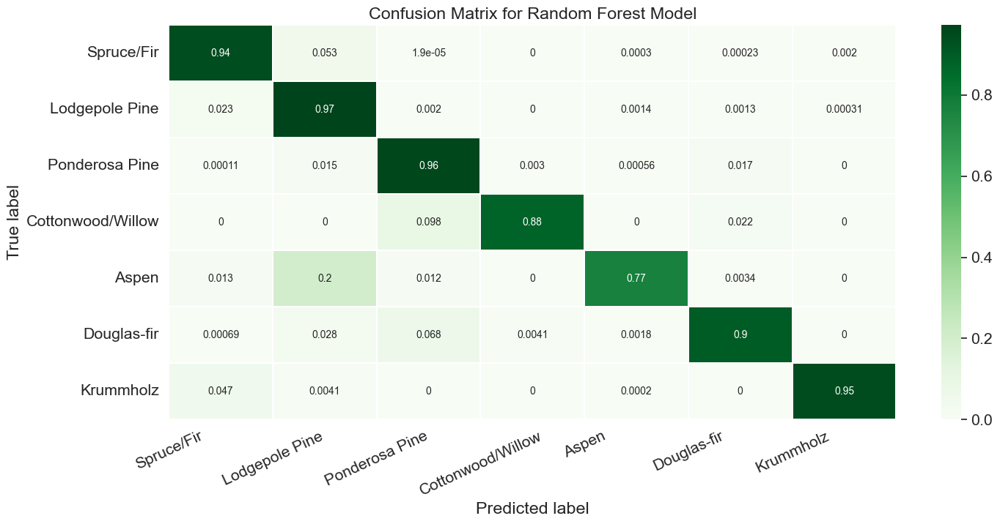

In [63]:
# Get and reshape confusion matrix data
matrix = confusion_matrix(y_test, y_pred_test_rf)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# Build the plot
plt.figure(figsize=(16,7))
sns.set(font_scale=1.4)
sns.heatmap(matrix, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Greens, linewidths=0.2)

# Add labels to the plot
class_names = ['Spruce/Fir', 'Lodgepole Pine', 'Ponderosa Pine', 
               'Cottonwood/Willow', 'Aspen', 'Douglas-fir',    
               'Krummholz']
tick_marks = np.arange(len(class_names))
tick_marks2 = tick_marks + 0.5
plt.xticks(tick_marks, class_names, rotation=25)
plt.yticks(tick_marks2, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix for Random Forest Model')
plt.show()

> Now it’s easier to see that the model struggles at predicting the Aspen label. About 20% of the time, Aspens were mislabeled as Lodgepole Pines!

> Let's reveiw the Classification report again for this model

In [53]:
# View the classification report for test data and predictions
class_names = ['Spruce/Fir', 'Lodgepole Pine', 'Ponderosa Pine', 
               'Cottonwood/Willow', 'Aspen', 'Douglas-fir',    
               'Krummholz']
print(classification_report(y_test, y_pred_test_rf,target_names=class_names))

                   precision    recall  f1-score   support

       Spruce/Fir       0.96      0.95      0.96     42368
   Lodgepole Pine       0.95      0.97      0.96     56661
   Ponderosa Pine       0.94      0.97      0.95      7151
Cottonwood/Willow       0.93      0.86      0.90       549
            Aspen       0.93      0.76      0.84      1899
      Douglas-fir       0.94      0.90      0.92      3473
        Krummholz       0.98      0.95      0.96      4102

         accuracy                           0.96    116203
        macro avg       0.95      0.91      0.93    116203
     weighted avg       0.96      0.96      0.96    116203



>Great improvement for (Aspen). Precision is higher than with KNN Model ( see below chart for comparision).

KNN Scores as comparison

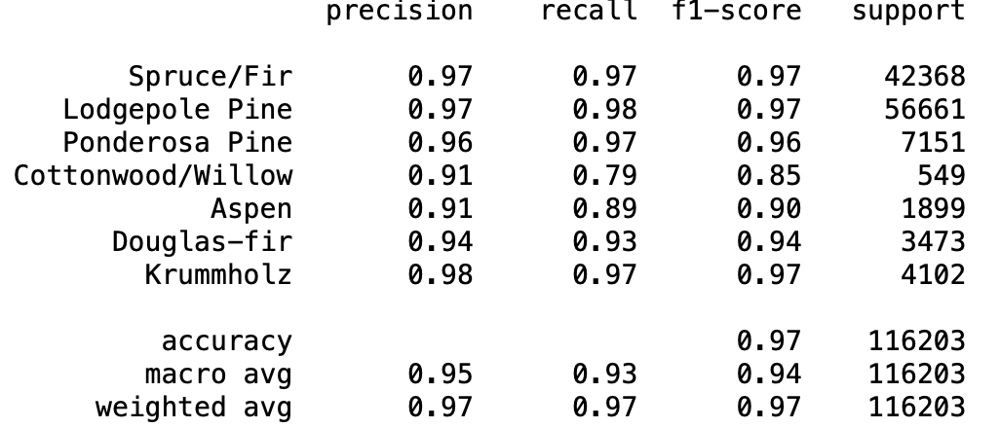

> Now that we have found a fast and precise model with Random Forest , let's optimize it fiding the best parameters using GridSearchCV.

In [101]:
# several grids can be cast into a list
# here we provide only one grid
param_grid = [
    {'n_estimators': [5, 10],
     'max_depth': [10, 20, None],
     'min_samples_split': [2, 10],
     'max_features': [0.4, 0.75, 1.],
     'max_samples': [0.4, 0.75, 1.],
    },
]

forest = RandomForestClassifier(
    random_state = 42,
    bootstrap = True,
)

In [102]:
tuned_model = GridSearchCV(
    estimator = forest, 
    param_grid = param_grid, 
    scoring = None, # uses estimator's default score method so R2
    n_jobs = -1, 
    refit = True, # keep a fitted version of the overall best model
    cv = 5, 
    return_train_score = True,
    verbose = 2,
)

In [103]:
%time tuned_model.fit(X_train, y_train) 

Fitting 5 folds for each of 108 candidates, totalling 540 fits
CPU times: user 23.6 s, sys: 2.62 s, total: 26.2 s
Wall time: 21min 29s


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid=[{'max_depth': [10, 20, None],
                          'max_features': [0.4, 0.75, 1.0],
                          'max_samples': [0.4, 0.75, 1.0],
                          'min_samples_split': [2, 10],
                          'n_estimators': [5, 10]}],
             return_train_score=True, verbose=2)

[CV] END max_depth=10, max_features=0.4, max_samples=0.4, min_samples_split=2, n_estimators=5; total time=   3.9s
[CV] END max_depth=10, max_features=0.4, max_samples=0.4, min_samples_split=10, n_estimators=5; total time=   3.7s
[CV] END max_depth=10, max_features=0.4, max_samples=0.4, min_samples_split=10, n_estimators=10; total time=   6.5s
[CV] END max_depth=10, max_features=0.4, max_samples=0.75, min_samples_split=2, n_estimators=10; total time=   9.4s
[CV] END max_depth=10, max_features=0.4, max_samples=0.75, min_samples_split=10, n_estimators=10; total time=   9.2s
[CV] END max_depth=10, max_features=0.4, max_samples=1.0, min_samples_split=2, n_estimators=10; total time=  13.5s
[CV] END max_depth=10, max_features=0.4, max_samples=1.0, min_samples_split=10, n_estimators=10; total time=  13.2s
[CV] END max_depth=10, max_features=0.75, max_samples=0.4, min_samples_split=2, n_estimators=10; total time=  11.6s
[CV] END max_depth=10, max_features=0.75, max_samples=0.4, min_samples_spli

[CV] END max_depth=10, max_features=0.4, max_samples=0.4, min_samples_split=2, n_estimators=10; total time=   7.0s
[CV] END max_depth=10, max_features=0.4, max_samples=0.4, min_samples_split=10, n_estimators=10; total time=   6.6s
[CV] END max_depth=10, max_features=0.4, max_samples=0.75, min_samples_split=2, n_estimators=5; total time=   4.9s
[CV] END max_depth=10, max_features=0.4, max_samples=0.75, min_samples_split=10, n_estimators=5; total time=   4.9s
[CV] END max_depth=10, max_features=0.4, max_samples=0.75, min_samples_split=10, n_estimators=5; total time=   4.7s
[CV] END max_depth=10, max_features=0.4, max_samples=1.0, min_samples_split=2, n_estimators=5; total time=   5.8s
[CV] END max_depth=10, max_features=0.4, max_samples=1.0, min_samples_split=2, n_estimators=10; total time=  13.9s
[CV] END max_depth=10, max_features=0.75, max_samples=0.4, min_samples_split=2, n_estimators=5; total time=   6.9s
[CV] END max_depth=10, max_features=0.75, max_samples=0.4, min_samples_split=2

[CV] END max_depth=10, max_features=0.4, max_samples=0.4, min_samples_split=2, n_estimators=10; total time=   6.9s
[CV] END max_depth=10, max_features=0.4, max_samples=0.4, min_samples_split=10, n_estimators=5; total time=   3.6s
[CV] END max_depth=10, max_features=0.4, max_samples=0.75, min_samples_split=2, n_estimators=5; total time=   4.8s
[CV] END max_depth=10, max_features=0.4, max_samples=0.75, min_samples_split=2, n_estimators=10; total time=   9.2s
[CV] END max_depth=10, max_features=0.4, max_samples=0.75, min_samples_split=10, n_estimators=10; total time=   9.3s
[CV] END max_depth=10, max_features=0.4, max_samples=1.0, min_samples_split=2, n_estimators=10; total time=  13.9s
[CV] END max_depth=10, max_features=0.4, max_samples=1.0, min_samples_split=10, n_estimators=10; total time=  12.6s
[CV] END max_depth=10, max_features=0.75, max_samples=0.4, min_samples_split=10, n_estimators=5; total time=   5.7s
[CV] END max_depth=10, max_features=0.75, max_samples=0.4, min_samples_spli

[CV] END max_depth=10, max_features=0.4, max_samples=0.4, min_samples_split=2, n_estimators=10; total time=   6.8s
[CV] END max_depth=10, max_features=0.4, max_samples=0.4, min_samples_split=10, n_estimators=5; total time=   3.6s
[CV] END max_depth=10, max_features=0.4, max_samples=0.4, min_samples_split=10, n_estimators=10; total time=   6.4s
[CV] END max_depth=10, max_features=0.4, max_samples=0.75, min_samples_split=10, n_estimators=5; total time=   4.6s
[CV] END max_depth=10, max_features=0.4, max_samples=0.75, min_samples_split=10, n_estimators=5; total time=   4.9s
[CV] END max_depth=10, max_features=0.4, max_samples=1.0, min_samples_split=2, n_estimators=5; total time=   5.3s
[CV] END max_depth=10, max_features=0.4, max_samples=1.0, min_samples_split=2, n_estimators=5; total time=   6.8s
[CV] END max_depth=10, max_features=0.4, max_samples=1.0, min_samples_split=10, n_estimators=5; total time=   7.5s
[CV] END max_depth=10, max_features=0.4, max_samples=1.0, min_samples_split=10,

In [105]:
best_model = tuned_model.best_estimator_
best_model

RandomForestClassifier(max_features=0.75, max_samples=1.0, n_estimators=10,
                       random_state=42)

> We have now the best parameters , let's use them to see what would be the best score

In [54]:
forest_best=RandomForestClassifier(
    n_estimators = 10, 
    class_weight = 'balanced', # classifier specific
    criterion = 'gini',  # classifier specific
    max_depth = None, 
    min_samples_split = 2, 
    min_samples_leaf = 1, 
    min_weight_fraction_leaf = 0.0, 
    max_features = 0.75, 
    max_leaf_nodes = None, 
    min_impurity_decrease = 0.0, 
    ccp_alpha = 0.0, 
    random_state = 42, 
    bootstrap = True, 
    oob_score = True, 
    max_samples = 1.0,
    warm_start = False, 
    n_jobs = -1, 
    verbose = 0, 
)

In [55]:
%time forest_best.fit(X_train, y_train)

CPU times: user 35.3 s, sys: 474 ms, total: 35.8 s
Wall time: 7.51 s


/Users/bcoquard/opt/anaconda3/envs/mlcourse/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:586: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  warn(


RandomForestClassifier(class_weight='balanced', max_features=0.75,
                       max_samples=1.0, n_estimators=10, n_jobs=-1,
                       oob_score=True, random_state=42)

In [56]:
# Make predictions for the test set
%time y_pred_test_rf_best = forest_best.predict(X_test)

CPU times: user 366 ms, sys: 68.3 ms, total: 434 ms
Wall time: 139 ms


In [57]:
# View the classification report for test data and predictions
print(classification_report(y_test, y_pred_test_rf_best,target_names=class_names))

                   precision    recall  f1-score   support

       Spruce/Fir       0.96      0.97      0.96     42368
   Lodgepole Pine       0.97      0.97      0.97     56661
   Ponderosa Pine       0.94      0.96      0.95      7151
Cottonwood/Willow       0.91      0.85      0.88       549
            Aspen       0.93      0.82      0.87      1899
      Douglas-fir       0.94      0.91      0.92      3473
        Krummholz       0.98      0.95      0.96      4102

         accuracy                           0.96    116203
        macro avg       0.95      0.92      0.93    116203
     weighted avg       0.96      0.96      0.96    116203



>As a comparison with the initial scores, we see that Aspen is better predict and as a whole , the recall score of the model is better by 1%( 91% to 92%). How ever it is pretty similar results with 96% which is excellent.

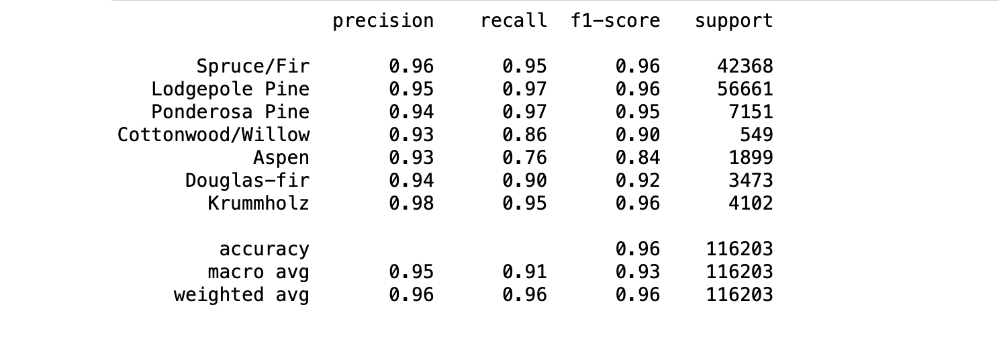

<a id="nans"></a>

### $\bullet$ Conclusion


[Back to top](#conclusion)

> As a conclusion we would there fore select the Random Forest Classifier Model as it both delivers great precision, accurancy and speed.
Vs Random Forest , KNN for Classifier delivered slightly better score performance on Aspen 90% vs 87% , but less on CottonWood 85% vs 87% for Random Forrest in general.

> Last but not least the model generalze well as both Train and Test sets are close in terms of accuracy.

<a id="save_data"></a>

<a id="numericalize_data"></a>

<a id='bottom'></a>

[Back to top](#plan)